In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import time
import torch
import torch.nn as nn
import seaborn as sns
import math
from sklearn.metrics import mean_squared_error


In [2]:
import pytorch_lightning as pl

C:\Users\Przem\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Przem\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Przem\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Przem\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.

In [3]:
df = pd.read_excel('data.xlsx', skiprows=2)

In [4]:
df.head(10).style.set_table_styles(
[{'selector': 'th',
  'props': [('background', '#008080'), 
            ('color', 'white'),
            ('font-family', 'verdana')]},
 {'selector': 'td',
  'props': [('font-family', 'verdana'),
            ('color', 'black')]},

 {'selector': 'tr:nth-of-type(odd)',
  'props': [('background', '#DCDCDC')]}, 
 
 
 {'selector': 'tr:nth-of-type(even)',
  'props': [('background', 'white')]},
 
  {'selector': 'tr:hover',
  'props': [('background', 'yellow')]},
]).hide_index()

data obrotu,data dostawy,godzina dostawy,kurs fixingu I (PLN/MWh),wolumen fixingu I (MWh),kurs fixingu II (PLN/MWh),wolumen fixingu II (MWh),kurs notowan ciaglych (PLN/MWh),wolumen notowan ciaglych (MWh)
2018-01-01 00:00:00,2018-01-02 00:00:00,1,117.000000,1916.600000,112.21,316.800000,116.00,2.00
2018-01-01 00:00:00,2018-01-02 00:00:00,2,117.000000,1935.500000,111.44,346.600000,116.00,2.00
2018-01-01 00:00:00,2018-01-02 00:00:00,3,116.880000,2008.100000,110.92,344.000000,116.00,2.00
2018-01-01 00:00:00,2018-01-02 00:00:00,4,117.000000,1971.500000,111.16,351.000000,116.00,2.00
2018-01-01 00:00:00,2018-01-02 00:00:00,5,121.130000,1935.300000,112.42,332.700000,119.00,2.00
2018-01-01 00:00:00,2018-01-02 00:00:00,6,130.910000,2025.800000,121.28,255.800000,130.91,2.00
2018-01-01 00:00:00,2018-01-02 00:00:00,7,150.000000,1711.700000,144.91,276.000000,-,-
2018-01-01 00:00:00,2018-01-02 00:00:00,8,167.740000,1795.600000,164.07,634.000000,-,-
2018-01-01 00:00:00,2018-01-02 00:00:00,9,180.050000,1936.400000,188.66,963.700000,-,-
2018-01-01 00:00:00,2018-01-02 00:00:00,10,187.580000,1862.700000,189.75,1152.400000,-,-


In [5]:
df.shape

(18264, 9)

In [6]:
df['year'] = pd.DatetimeIndex(df['data dostawy']).year
df['month'] = pd.DatetimeIndex(df['data dostawy']).month
df['day'] = pd.DatetimeIndex(df['data dostawy']).day

In [7]:
df_ = pd.DataFrame({'year': df['year'],
                     'month': df['month'],
                     'day': df['day']})

In [8]:
df['godzina dostawy'] = pd.to_numeric(df['godzina dostawy'], errors='coerce')

In [9]:
df['godzina dostawy'].isnull().sum()

2

In [10]:
df = df.dropna()

In [11]:
df['date'] = pd.to_datetime(df_) + pd.to_timedelta(df['godzina dostawy'], unit='h')

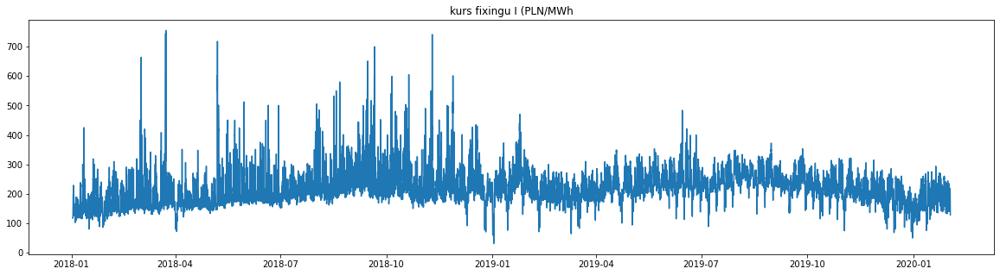

In [12]:
plt.figure(figsize=(20,5))
plt.plot(df['date'], df['kurs fixingu I (PLN/MWh)'])
plt.title("kurs fixingu I (PLN/MWh")
params = {"ytick.color" : "w",
          "xtick.color" : "white",
          "axes.labelcolor" : "white",
          "axes.edgecolor" : "white"
        }
plt.rcParams.update(params)
plt.show()

In [13]:
df = pd.DataFrame(data={'Date': df['date'], 'Kurs fixing':df['kurs fixingu I (PLN/MWh)']})

In [14]:
price = df[['Kurs fixing']]
scaler = MinMaxScaler(feature_range=(-1, 1))
# price['Kurs fixing'] = scaler.fit_transform(price['Kurs fixing'].values.reshape(-1,1))
price['Kurs fixing'] = scaler.fit_transform(price['Kurs fixing'].values.reshape(-1,1))

C:\Users\Przem\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [15]:
price

,Kurs fixing
0,-0.762431
1,-0.762431
2,-0.762762
3,-0.762431
4,-0.751022
...,...
18259,-0.505939
18260,-0.559613
18261,-0.631354
18262,-0.674033


In [16]:
def split_data(stock, lookback):
    data_raw = stock.to_numpy() # convert to numpy array
    
    data = []
    
    # create all possible sequences of length seq_len
    for index in range(len(data_raw) - lookback): 
        data.append(data_raw[index: index + lookback])
    
    data = np.array(data);
    test_set_size = int(np.round(0.2*data.shape[0]));
    train_set_size = data.shape[0] - (test_set_size);
    
    x_train = data[:train_set_size,:-1,:]
    y_train = data[:train_set_size,-1,:]
    
    x_test = data[train_set_size:,:-1]
    y_test = data[train_set_size:,-1,:]
    
    return [x_train, y_train, x_test, y_test]

In [17]:
lookback = 20 # choose sequence length
x_train, y_train, x_test, y_test = split_data(price, lookback)

[[-0.76243094]
 [-0.76243094]
 [-0.76276243]
 ...
 [-0.63135359]
 [-0.67403315]
 [-0.73232044]]
18262


In [18]:
x_train = torch.from_numpy(x_train).type(torch.Tensor)
x_test = torch.from_numpy(x_test).type(torch.Tensor)
y_train_lstm = torch.from_numpy(y_train).type(torch.Tensor)
y_test_lstm = torch.from_numpy(y_test).type(torch.Tensor)

In [19]:
#Hyper-parametres
input_dim = 1
hidden_dim = 32
num_layers = 2
output_dim = 1
num_epochs = 80

In [20]:
class LSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(LSTM, self).__init__()
        
        
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        
        
        self.fc = nn.Linear(hidden_dim, output_dim)
        
        
    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))
        out = self.fc(out[:, -1, :]) 
        return out

In [21]:
model = LSTM(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)
criterion = torch.nn.MSELoss(reduction='mean')
optimiser = torch.optim.Adam(model.parameters(), lr=0.01)

In [22]:
hist = np.zeros(num_epochs)
start_time = time.time()
lstm = []
for t in range(num_epochs):
    y_train_pred = model(x_train)
    loss = criterion(y_train_pred, y_train_lstm)
    print("Epoch ", t, "MSE: ", loss.item())
    hist[t] = loss.item()
    optimiser.zero_grad()
    loss.backward()
    optimiser.step()
    
training_time = time.time()-start_time
print("Training time: {}".format(training_time))

Epoch  0 MSE:  0.37004026770591736
Epoch  1 MSE:  0.20863668620586395
Epoch  2 MSE:  0.06854265928268433
Epoch  3 MSE:  0.07328442484140396
Epoch  4 MSE:  0.059744011610746384
Epoch  5 MSE:  0.030474543571472168
Epoch  6 MSE:  0.03396539017558098
Epoch  7 MSE:  0.043079499155282974
Epoch  8 MSE:  0.04528607428073883
Epoch  9 MSE:  0.04104476422071457
Epoch  10 MSE:  0.03441909700632095
Epoch  11 MSE:  0.02958342619240284
Epoch  12 MSE:  0.02907503768801689
Epoch  13 MSE:  0.03216857090592384
Epoch  14 MSE:  0.03484117239713669
Epoch  15 MSE:  0.03428865224123001
Epoch  16 MSE:  0.03153293952345848
Epoch  17 MSE:  0.028999587520956993
Epoch  18 MSE:  0.02803274430334568
Epoch  19 MSE:  0.028484119102358818
Epoch  20 MSE:  0.029483657330274582
Epoch  21 MSE:  0.030195562168955803
Epoch  22 MSE:  0.030176814645528793
Epoch  23 MSE:  0.029428968206048012
Epoch  24 MSE:  0.028288792818784714
Epoch  25 MSE:  0.02723783068358898
Epoch  26 MSE:  0.02667159214615822
Epoch  27 MSE:  0.0266891214

In [23]:
predict = pd.DataFrame(scaler.inverse_transform(y_train_pred.detach().numpy()))
original = pd.DataFrame(scaler.inverse_transform(y_train_lstm.detach().numpy()))

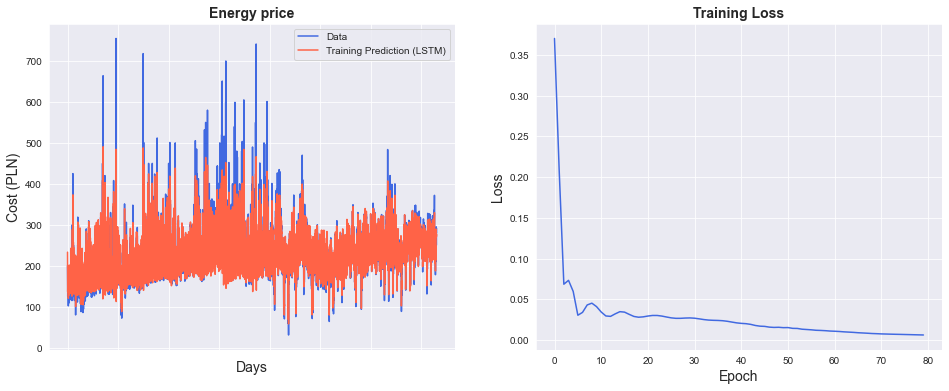

In [24]:
sns.set_style("darkgrid")    

fig = plt.figure()
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot(1, 2, 1)
ax = sns.lineplot(x = original.index, y = original[0], label="Data", color='royalblue')
ax = sns.lineplot(x = predict.index, y = predict[0], label="Training Prediction (LSTM)", color='tomato')
ax.set_title('Energy price', size = 14, fontweight='bold')
ax.set_xlabel("Days", size = 14)
ax.set_ylabel("Cost (PLN)", size = 14)
ax.set_xticklabels('', size=10)


plt.subplot(1, 2, 2)
ax = sns.lineplot(data=hist, color='royalblue')
ax.set_xlabel("Epoch", size = 14)
ax.set_ylabel("Loss", size = 14)
ax.set_title("Training Loss", size = 14, fontweight='bold')
fig.set_figheight(6)
fig.set_figwidth(16)

In [25]:
# make predictions
y_test_pred = model(x_test)

# invert predictions
y_train_pred = scaler.inverse_transform(y_train_pred.detach().numpy())
y_train = scaler.inverse_transform(y_train_lstm.detach().numpy())
y_test_pred = scaler.inverse_transform(y_test_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test_lstm.detach().numpy())

# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(y_train[:,0], y_train_pred[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(y_test[:,0], y_test_pred[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
lstm.append(trainScore)
lstm.append(testScore)
lstm.append(training_time)

Train Score: 28.63 RMSE
Test Score: 17.44 RMSE


In [26]:
# shift train predictions for plotting
trainPredictPlot = np.empty_like(price)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[lookback:len(y_train_pred)+lookback, :] = y_train_pred

# shift test predictions for plotting
testPredictPlot = np.empty_like(price)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(y_train_pred)+lookback-1:len(price)-1, :] = y_test_pred

original = scaler.inverse_transform(price['Kurs fixing'].values.reshape(-1,1))

predictions = np.append(trainPredictPlot, testPredictPlot, axis=1)
predictions = np.append(predictions, original, axis=1)
result = pd.DataFrame(predictions)

In [27]:
import plotly.express as px
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(go.Scatter(x=result.index, y=result[0],
                    mode='lines',
                    name='Train prediction')))
fig.add_trace(go.Scatter(x=result.index, y=result[1],
                    mode='lines',
                    name='Test prediction'))
fig.add_trace(go.Scatter(go.Scatter(x=result.index, y=result[2],
                    mode='lines',
                    name='Actual Value')))
fig.update_layout(
    xaxis=dict(
        showline=True,
        showgrid=True,
        showticklabels=False,
        linecolor='white',
        linewidth=2
    ),
    yaxis=dict(
        title_text='Close (PLN)',
        titlefont=dict(
            family='Rockwell',
            size=12,
            color='white',
        ),
        showline=True,
        showgrid=True,
        showticklabels=True,
        linecolor='white',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Rockwell',
            size=12,
            color='white',
        ),
    ),
    showlegend=True,
    template = 'plotly_dark'

)



annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Results (LSTM)',
                              font=dict(family='Rockwell',
                                        size=26,
                                        color='white'),
                              showarrow=False))
fig.update_layout(annotations=annotations)

fig.show()

In [28]:
class GRU(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(GRU, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        out, (hn) = self.gru(x, (h0.detach()))
        out = self.fc(out[:, -1, :]) 
        return out

In [29]:
model = GRU(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)
criterion = torch.nn.MSELoss(reduction='mean')
optimiser = torch.optim.Adam(model.parameters(), lr=0.05)

In [30]:
hist = np.zeros(num_epochs)
start_time = time.time()
lstm = []
for t in range(num_epochs):
    y_train_pred = model(x_train)
    loss = criterion(y_train_pred, y_train_lstm)
    print("Epoch ", t, "MSE: ", loss.item())
    hist[t] = loss.item()
    optimiser.zero_grad()
    loss.backward()
    optimiser.step()
    
training_time = time.time()-start_time
print("Training time: {}".format(training_time))

Epoch  0 MSE:  0.14486196637153625
Epoch  1 MSE:  1.0360949039459229
Epoch  2 MSE:  0.26168933510780334
Epoch  3 MSE:  0.1366642266511917
Epoch  4 MSE:  0.03649824485182762
Epoch  5 MSE:  0.02572334185242653
Epoch  6 MSE:  0.03836304321885109
Epoch  7 MSE:  0.019601620733737946
Epoch  8 MSE:  0.04282993823289871
Epoch  9 MSE:  0.023410847410559654
Epoch  10 MSE:  0.025127382948994637
Epoch  11 MSE:  0.023843815550208092
Epoch  12 MSE:  0.014219606295228004
Epoch  13 MSE:  0.0209200382232666
Epoch  14 MSE:  0.018234267830848694
Epoch  15 MSE:  0.019941972568631172
Epoch  16 MSE:  0.007907308638095856
Epoch  17 MSE:  0.005625950172543526
Epoch  18 MSE:  0.0072477348148822784
Epoch  19 MSE:  0.008707796223461628
Epoch  20 MSE:  0.010617190971970558
Epoch  21 MSE:  0.011968090198934078
Epoch  22 MSE:  0.009042547084391117
Epoch  23 MSE:  0.008258706890046597
Epoch  24 MSE:  0.007915486581623554
Epoch  25 MSE:  0.007046782877296209
Epoch  26 MSE:  0.007185462862253189
Epoch  27 MSE:  0.0064

In [31]:
predict = pd.DataFrame(scaler.inverse_transform(y_train_pred.detach().numpy()))
original = pd.DataFrame(scaler.inverse_transform(y_train_lstm.detach().numpy()))

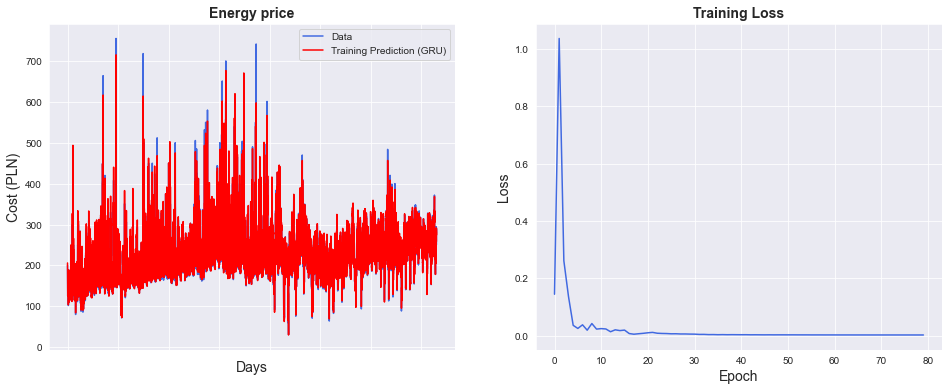

In [32]:
sns.set_style("darkgrid")    

fig = plt.figure()
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot(1, 2, 1)
ax = sns.lineplot(x = original.index, y = original[0], label="Data", color='royalblue')
ax = sns.lineplot(x = predict.index, y = predict[0], label="Training Prediction (GRU)", color='red')
ax.set_title('Energy price', size = 14, fontweight='bold')
ax.set_xlabel("Days", size = 14)
ax.set_ylabel("Cost (PLN)", size = 14)
ax.set_xticklabels('', size=10)


plt.subplot(1, 2, 2)
ax = sns.lineplot(data=hist, color='royalblue')
ax.set_xlabel("Epoch", size = 14)
ax.set_ylabel("Loss", size = 14)
ax.set_title("Training Loss", size = 14, fontweight='bold')
fig.set_figheight(6)
fig.set_figwidth(16)

In [33]:
# make predictions
y_test_pred = model(x_test)

# invert predictions
y_train_pred = scaler.inverse_transform(y_train_pred.detach().numpy())
y_train = scaler.inverse_transform(y_train_lstm.detach().numpy())
y_test_pred = scaler.inverse_transform(y_test_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test_lstm.detach().numpy())

# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(y_train[:,0], y_train_pred[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(y_test[:,0], y_test_pred[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
lstm.append(trainScore)
lstm.append(testScore)
lstm.append(training_time)

Train Score: 19.66 RMSE
Test Score: 13.77 RMSE


In [34]:
# shift train predictions for plotting
trainPredictPlot = np.empty_like(price)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[lookback:len(y_train_pred)+lookback, :] = y_train_pred

# shift test predictions for plotting
testPredictPlot = np.empty_like(price)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(y_train_pred)+lookback-1:len(price)-1, :] = y_test_pred

original = scaler.inverse_transform(price['Kurs fixing'].values.reshape(-1,1))

predictions = np.append(trainPredictPlot, testPredictPlot, axis=1)
predictions = np.append(predictions, original, axis=1)
result = pd.DataFrame(predictions)

In [35]:
import plotly.express as px
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(go.Scatter(x=result.index, y=result[0],
                    mode='lines',
                    name='Train prediction')))
fig.add_trace(go.Scatter(x=result.index, y=result[1],
                    mode='lines',
                    name='Test prediction'))
fig.add_trace(go.Scatter(go.Scatter(x=result.index, y=result[2],
                    mode='lines',
                    name='Actual Value')))
fig.update_layout(
    xaxis=dict(
        showline=True,
        showgrid=True,
        showticklabels=False,
        linecolor='white',
        linewidth=2
    ),
    yaxis=dict(
        title_text='Close (PLN)',
        titlefont=dict(
            family='Rockwell',
            size=12,
            color='white',
        ),
        showline=True,
        showgrid=True,
        showticklabels=True,
        linecolor='white',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Rockwell',
            size=12,
            color='white',
        ),
    ),
    showlegend=True,
    template = 'plotly_dark'

)



annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Results (GRU)',
                              font=dict(family='Rockwell',
                                        size=26,
                                        color='white'),
                              showarrow=False))
fig.update_layout(annotations=annotations)

fig.show()